# Part 2_EXPLORATORY DATA ANALYSIS_Analysing and predicting the income of America 

In [45]:
! pip install missingno

You should consider upgrading via the 'C:\ProgramData\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [46]:
! pip install plotly
# Data wrangling
import pandas as pd 
import csv

# Visualization
import matplotlib.pyplot as plt 
import seaborn as sns 

# Date wrangling
import datetime

# Math operations
import numpy as np

# Random sampling
import random
import missingno as msno

from sklearn import svm
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score

import plotly.express as px
import plotly.graph_objects as go

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
pd.set_option('display.float_format', lambda x: f'%.{2}f' % x)
import math
from sklearn.ensemble import RandomForestRegressor

You should consider upgrading via the 'C:\ProgramData\Anaconda3\python.exe -m pip install --upgrade pip' command.


In [47]:
from scipy import stats
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split # split the data into train and test set 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error,explained_variance_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import RidgeCV
from numpy import arange

from sklearn import svm
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_error, r2_score

In [48]:
# Loading the dataset
df=pd.read_csv('E:/st.clair college canada/semester 4th/DAB402_Capstone project/Cleaned_US_CENSUS_DATA_2015.csv')
df.head(10)

,CensusTract,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
0,1001020100,Alabama,Autauga,1948,48.25,51.75,0.90,87.40,7.70,0.30,0.60,0.00,77.16,8.10,8.40,34.70,17.00,21.30,11.90,15.20,90.20,4.80,0.00,0.50,2.30,2.10,25.00,77.10,18.30,4.60,0.00,5.40,61838
1,1001020200,Alabama,Autauga,2156,49.12,50.88,0.80,40.40,53.30,0.00,2.30,0.00,77.09,25.50,40.30,22.30,24.70,21.50,9.40,22.00,86.30,13.10,0.00,0.00,0.70,0.00,23.40,77.00,16.90,6.10,0.00,13.30,32303
2,1001020300,Alabama,Autauga,2968,45.96,54.04,0.00,74.50,18.60,0.50,1.40,0.30,78.67,12.70,19.70,31.40,24.90,22.10,9.20,12.40,94.80,2.80,0.00,0.00,0.00,2.50,19.60,64.10,23.60,12.30,0.00,6.20,44922
3,1001020400,Alabama,Autauga,4423,49.11,50.89,10.50,82.80,3.70,1.60,0.00,0.00,74.75,2.10,1.60,27.00,20.80,27.00,8.70,16.40,86.60,9.10,0.00,0.00,2.60,1.60,25.30,75.70,21.20,3.10,0.00,10.80,54329
4,1001020500,Alabama,Autauga,10763,45.73,54.27,0.70,68.50,24.80,0.00,3.80,0.00,71.23,11.40,17.50,49.60,14.20,18.20,2.10,15.80,88.00,10.50,0.00,0.00,0.60,0.90,24.80,67.10,27.60,5.30,0.00,4.20,51965
5,1001020600,Alabama,Autauga,3851,46.40,53.60,13.10,72.90,11.90,0.00,0.00,0.00,68.61,14.40,21.90,24.20,17.50,35.40,7.90,14.90,82.70,6.90,0.00,0.00,6.00,4.50,19.80,79.40,14.70,5.80,0.00,10.90,63092
6,1001020700,Alabama,Autauga,2761,43.82,56.18,3.80,74.50,19.70,0.00,0.00,0.00,74.61,28.90,41.90,19.50,29.60,25.30,10.10,15.50,92.40,7.60,0.00,0.00,0.00,0.00,20.00,82.00,14.60,3.40,0.00,11.40,34821
7,1001020801,Alabama,Autauga,3187,47.13,52.87,1.30,84.00,10.70,3.10,0.00,0.00,75.02,13.00,25.90,42.80,10.70,34.20,5.50,6.80,84.30,8.10,0.00,0.00,1.70,5.90,24.30,78.10,14.80,7.10,0.00,8.20,73728
8,1001020802,Alabama,Autauga,10915,50.26,49.74,1.40,89.50,8.40,0.00,0.00,0.00,71.26,13.90,18.30,31.50,17.50,26.10,7.80,17.10,90.10,8.60,0.00,0.00,0.00,1.30,29.40,73.30,22.10,4.60,0.00,8.70,60063
9,1001020900,Alabama,Autauga,5668,51.11,48.89,0.40,85.50,12.10,0.00,0.30,0.00,74.40,6.80,10.00,29.30,13.70,17.70,11.00,28.30,88.70,7.90,0.00,0.00,1.20,2.10,32.90,77.90,15.20,6.90,0.00,7.20,41287


### Data information

In [49]:
# Finding the input dataset size and shape
df.shape

(72727, 33)

In [50]:
# show the data types of attributes 
df.dtypes

CensusTract       int64
State            object
County           object
TotalPop          int64
Men             float64
Women           float64
Hispanic        float64
White           float64
Black           float64
Native          float64
Asian           float64
Pacific         float64
Citizen         float64
Poverty         float64
ChildPoverty    float64
Professional    float64
Service         float64
Office          float64
Construction    float64
Production      float64
Drive           float64
Carpool         float64
Transit         float64
Walk            float64
OtherTransp     float64
WorkAtHome      float64
MeanCommute     float64
PrivateWork     float64
PublicWork      float64
SelfEmployed    float64
FamilyWork      float64
Unemployment    float64
Income            int64
dtype: object

In [51]:
#Descriptive Analytics of quantitative variables in the dataframe
df.describe()

,CensusTract,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
count,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00
mean,28380476252.04,4383.55,49.10,50.90,16.87,62.06,13.24,0.72,4.59,0.14,71.28,16.89,22.47,34.80,19.08,23.93,9.31,12.88,75.71,9.64,5.44,3.01,1.88,4.32,25.69,79.01,14.60,6.22,0.17,9.00,57259.14
std,16440495735.95,2087.99,4.04,4.04,22.94,30.68,21.75,4.46,8.79,1.03,10.63,12.95,19.11,14.91,8.14,5.72,5.94,7.57,15.04,5.22,11.68,5.32,2.51,3.65,6.94,8.14,7.37,3.84,0.46,5.80,28663.97
min,1001020100.00,41.00,5.19,0.54,0.00,0.00,0.00,0.00,0.00,0.00,7.92,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.90,14.10,0.00,0.00,0.00,0.00,2611.00
25%,13051002450.00,2944.00,46.89,48.88,2.40,39.40,0.70,0.00,0.20,0.00,66.80,7.30,7.00,24.10,13.50,20.20,5.00,7.10,72.10,6.00,0.00,0.40,0.40,1.80,20.90,74.60,9.60,3.60,0.00,5.10,37716.00
50%,28047003501.00,4098.00,49.05,50.95,7.00,71.40,3.70,0.00,1.40,0.00,73.61,13.40,17.80,32.60,17.90,23.70,8.40,11.80,79.80,8.80,1.10,1.40,1.20,3.50,25.00,80.10,13.40,5.50,0.00,7.70,51106.00
75%,42003412551.00,5467.50,51.12,53.11,20.50,88.40,14.30,0.40,4.80,0.00,78.03,23.10,33.70,43.80,23.50,27.50,12.50,17.50,84.90,12.30,4.70,3.40,2.50,5.90,29.80,84.60,18.20,8.10,0.00,11.30,70147.00
max,72153750602.00,53812.00,99.46,94.81,100.00,100.00,100.00,100.00,91.30,84.70,99.78,98.60,100.00,100.00,74.10,74.40,69.30,60.00,100.00,56.40,92.20,90.90,58.60,90.60,70.50,100.00,85.70,48.60,26.50,68.80,248750.00


In [52]:
#checking the missing values in each attributes
df.isnull().sum().sum()

0

In [53]:
df.nunique()  # Check the unique values in my dataset.

CensusTract     72727
State              52
County           1926
TotalPop         9486
Men             68348
Women           68348
Hispanic         1001
White            1001
Black            1000
Native            462
Asian             763
Pacific           175
Citizen         70436
Poverty           815
ChildPoverty      960
Professional      864
Service           589
Office            470
Construction      481
Production        491
Drive             977
Carpool           413
Transit           831
Walk              565
OtherTransp       286
WorkAtHome        338
MeanCommute       521
PrivateWork       676
PublicWork        631
SelfEmployed      315
FamilyWork         73
Unemployment      468
Income          41503
dtype: int64

 ## Check total population density in Each states

In [54]:
df_mean = df.groupby(['State']).mean()

In [55]:
fig = go.Figure(data=[
    go.Bar(name='Men', x=df_mean.index, y=df_mean['Men']),
    go.Bar(name='Women', x=df_mean.index, y=df_mean['Women'])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.update_layout(
    title=" Population density in states of US ",
    width = 1000,
    height = 700,
)
fig.show()

 ### Here, bar graph shows the population level of men and women according to states in the US. The population of women highest in States of US as compared to Men category. Most of men population lived in ALASKA and North Dakota where as women popluation is slightly low. 

### Lets see how many of people work is in the US as a percentage of the total 

## 1. In which occupation people worked more or have highest employment rate?

<AxesSubplot:title={'center':'Percentage of Americans by work'}>

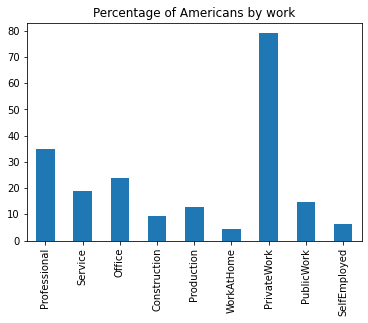

In [56]:
occu_columns = ['Professional', 'Service',
       'Office', 'Construction', 'Production','WorkAtHome',
       'PrivateWork', 'PublicWork', 'SelfEmployed']
census_occu = df[occu_columns]

(census_occu.sum()/len(census_occu)).plot.bar(title = "Percentage of Americans by work")

#### The dataset contains the 9 types of occupations in US. Here, we can say that private sector has highest employment rate , followed by the professional category. So in the private sector, 70-80% people are working under this category whereas professional category on second position where employment rate is good.The service, office construction, production, work at home, public work and self employed have lowest employment rate.


## Correlations between races and poverty

<AxesSubplot:>

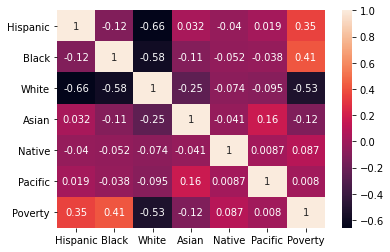

In [57]:
Corr_race = ( df.loc[:, ['Hispanic', 'Black', 'White', 'Asian', 'Native','Pacific','Poverty']]).corr()

sns.heatmap(Corr_race, annot=True)

### Here is a heatmap to see correlations between races and poverty. If you focus on the right-most column, you'll see which races are most correlated with poverty. Hispanic is the most, and white is the least. The most strongly negatively correlated features are between hispanics and whites, so the more hispanics you have the less whites you have., and the second most strongly correlated feature is whites and poverty.

###  There is a negative correlation between hispanic and black areas interestingly

### Lets see how many of each race is in the US as a percentage of the total 

## 2. Estimate the highest poverty rate in race population?

<AxesSubplot:title={'center':'Percentage of Americans by Race'}>

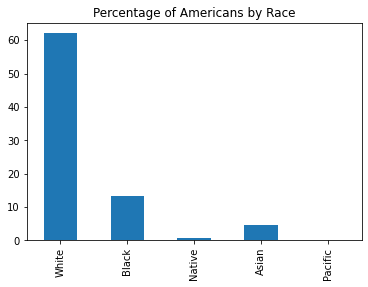

In [58]:
race_columns = ['White','Black','Native','Asian','Pacific']
census_races = df[race_columns]

(census_races.sum()/len(census_races)).plot.bar(title = "Percentage of Americans by Race")

#### We can observed from above graph that white people have highest density in US as compared to other race features.

## Lets see Poverty level with Race population in US 

#### 1. Poverty Level with White people 

<AxesSubplot:title={'center':'Percentage of white  Americans by poverty'}>

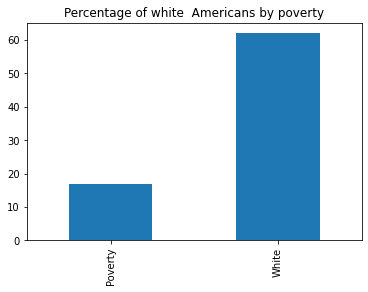

In [59]:
pov_columns = ['Poverty','White']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of white  Americans by poverty")

### 2. Poverty Level with Black people 

<AxesSubplot:title={'center':'Percentage of Black  Americans by poverty'}>

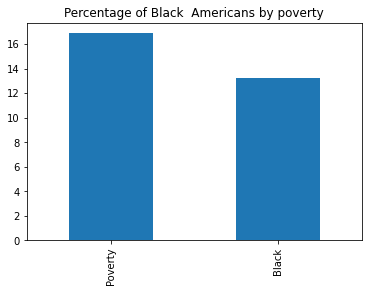

In [60]:
pov_columns = ['Poverty','Black']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of Black  Americans by poverty")

### 3. Poverty Level with Asian people 

<AxesSubplot:title={'center':'Percentage of Asian  Americans by poverty'}>

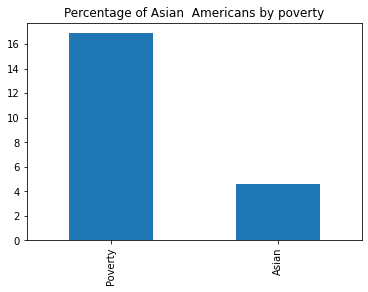

In [61]:
pov_columns = ['Poverty','Asian']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of Asian  Americans by poverty")

### 4. Poverty Level with Hispanic people 

<AxesSubplot:title={'center':'Percentage of Hispanic  Americans by poverty'}>

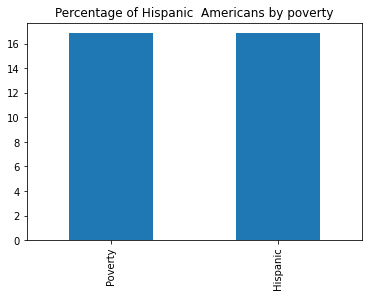

In [62]:
pov_columns = ['Poverty','Hispanic']
census_pov = df[pov_columns]

(census_pov.sum()/len(census_pov)).plot.bar(title = "Percentage of Hispanic  Americans by poverty")

### Overall, its  shows that density of white people has less poverty level in the US. There are more than 60% white people accounted around 17-18% poverty level,Whereas  Black people have highest poverty level as compared to their density.Hispanic have high density with highest poverty level and Asian as well. 


# Correlation with Income 

In [63]:
corr = df.corr()['Income'].abs()
fig = px.bar(corr, x=corr.index.values, y=corr.values)

fig.update_layout(
    title="Correlation with Income",
    xaxis_title="Features",
    yaxis_title="Correlation values",
    legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)


fig.show()

#### From the above bar graph , we analyse the correlation of features with our target variable. Here, we can see that some of our features are making the good correlation with target variable ‘Income’ where as some features are showing bad correlation with target.

### Spearman correlation method

In [64]:
corr1 = df.corr(method='spearman').round(2)
corr1

,CensusTract,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
CensusTract,1.00,-0.02,-0.01,0.01,-0.14,0.13,-0.04,-0.00,-0.16,-0.09,0.09,-0.00,0.02,-0.01,-0.02,-0.03,0.03,0.07,0.08,-0.04,-0.06,0.04,-0.09,-0.08,-0.08,-0.01,0.06,-0.07,0.00,-0.11,-0.05
TotalPop,-0.02,1.00,0.00,-0.00,0.16,-0.05,-0.01,0.02,0.20,0.08,-0.23,-0.14,-0.12,0.09,-0.10,0.08,-0.00,-0.06,0.13,0.03,-0.04,-0.16,-0.02,0.02,0.12,0.04,-0.00,-0.04,0.02,-0.08,0.21
Men,-0.01,0.00,1.00,-1.00,0.06,0.10,-0.17,0.09,0.00,0.06,-0.01,-0.05,-0.05,-0.04,-0.05,-0.17,0.23,0.09,-0.03,0.07,-0.07,0.04,0.06,0.06,0.01,-0.00,-0.06,0.10,0.07,-0.07,0.08
Women,0.01,-0.00,-1.00,1.00,-0.06,-0.10,0.17,-0.09,-0.00,-0.06,0.01,0.05,0.05,0.04,0.05,0.17,-0.23,-0.09,0.03,-0.07,0.07,-0.04,-0.06,-0.06,-0.01,0.00,0.06,-0.10,-0.07,0.07,-0.08
Hispanic,-0.14,0.16,0.06,-0.06,1.00,-0.65,0.09,-0.00,0.27,0.13,-0.56,0.23,0.20,-0.20,0.24,0.04,0.10,-0.02,-0.28,0.20,0.26,0.08,0.16,-0.10,0.11,0.09,-0.11,0.02,-0.07,0.20,-0.10
White,0.13,-0.05,0.10,-0.10,-0.65,1.00,-0.57,0.05,-0.23,-0.10,0.56,-0.47,-0.42,0.30,-0.41,-0.04,0.06,-0.05,0.38,-0.21,-0.44,-0.09,-0.14,0.25,-0.15,-0.07,0.01,0.16,0.14,-0.43,0.33
Black,-0.04,-0.01,-0.17,0.17,0.09,-0.57,1.00,-0.07,0.08,-0.02,-0.19,0.33,0.30,-0.17,0.28,0.07,-0.17,0.07,-0.14,0.07,0.26,-0.00,0.04,-0.25,0.02,0.11,0.03,-0.31,-0.14,0.32,-0.28
Native,-0.00,0.02,0.09,-0.09,-0.00,0.05,-0.07,1.00,-0.04,0.10,0.04,0.07,0.06,-0.06,0.04,-0.03,0.13,0.06,0.00,0.09,-0.11,0.04,0.05,0.03,-0.15,-0.09,0.08,0.04,0.05,0.01,-0.08
Asian,-0.16,0.20,0.00,-0.00,0.27,-0.23,0.08,-0.04,1.00,0.17,-0.24,-0.27,-0.30,0.40,-0.17,0.02,-0.38,-0.41,-0.19,-0.11,0.34,0.02,0.09,0.16,0.13,0.10,-0.09,-0.05,-0.04,-0.17,0.41
Pacific,-0.09,0.08,0.06,-0.06,0.13,-0.10,-0.02,0.10,0.17,1.00,-0.08,-0.00,-0.02,0.00,0.04,0.02,0.01,-0.04,-0.08,0.08,0.05,0.02,0.08,0.04,-0.02,-0.05,0.04,0.02,0.01,0.01,0.05


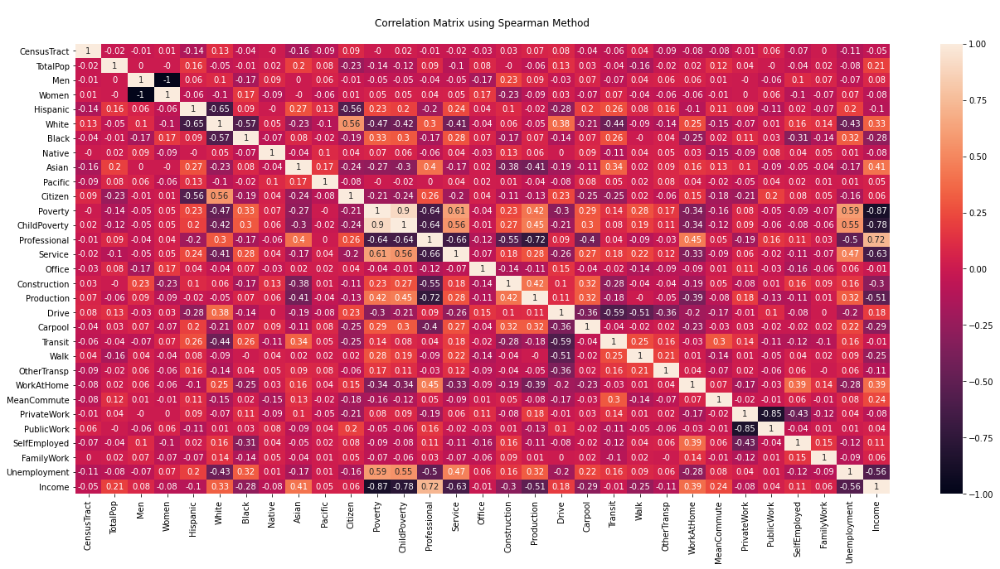

In [65]:
# plotting the correlation matrix
plt.figure(figsize=(22,10))
correlation_mat = df.corr(method='spearman').round(2)

sns.heatmap(correlation_mat, annot = True)
plt.title("\nCorrelation Matrix using Spearman Method\n")
plt.savefig("corr.png",bbox_inches='tight')
plt.show()

## Correlation Matrix using Pearson Method

In [66]:
corr= df.corr().round(2)
corr                            # Pearson Method of correlation 

,CensusTract,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
CensusTract,1.00,-0.03,-0.01,0.01,-0.02,0.08,-0.02,-0.00,-0.15,-0.06,0.10,0.05,0.05,-0.02,-0.01,-0.02,0.02,0.05,0.02,-0.04,0.02,0.04,-0.08,-0.10,-0.04,-0.03,0.07,-0.07,-0.01,-0.05,-0.07
TotalPop,-0.03,1.00,0.02,-0.02,0.11,-0.03,-0.11,-0.03,0.10,0.03,-0.20,-0.15,-0.15,0.08,-0.11,0.07,-0.01,-0.08,0.11,0.01,-0.08,-0.11,-0.06,-0.01,0.10,0.04,-0.00,-0.08,-0.03,-0.13,0.17
Men,-0.01,0.02,1.00,-1.00,0.06,0.09,-0.20,0.03,0.02,0.03,-0.01,-0.05,-0.06,-0.03,-0.04,-0.16,0.22,0.07,-0.02,0.07,-0.08,0.08,0.07,0.07,-0.04,-0.05,0.01,0.08,0.04,-0.09,0.05
Women,0.01,-0.02,-1.00,1.00,-0.06,-0.09,0.20,-0.03,-0.02,-0.03,0.01,0.05,0.06,0.03,0.04,0.16,-0.22,-0.07,0.02,-0.07,0.08,-0.08,-0.07,-0.07,0.04,0.05,-0.01,-0.08,-0.04,0.09,-0.05
Hispanic,-0.02,0.11,0.06,-0.06,1.00,-0.66,-0.12,-0.04,0.03,0.02,-0.63,0.35,0.32,-0.34,0.29,0.01,0.27,0.13,-0.19,0.27,0.14,0.02,0.12,-0.15,0.12,0.06,-0.09,0.06,-0.03,0.23,-0.23
White,0.08,-0.03,0.09,-0.09,-0.66,1.00,-0.58,-0.07,-0.25,-0.10,0.59,-0.53,-0.50,0.35,-0.47,-0.03,-0.04,-0.13,0.37,-0.26,-0.37,-0.07,-0.14,0.24,-0.21,-0.04,-0.03,0.13,0.06,-0.50,0.31
Black,-0.02,-0.11,-0.20,0.20,-0.12,-0.58,1.00,-0.05,-0.11,-0.04,-0.07,0.41,0.41,-0.25,0.38,0.06,-0.13,0.14,-0.20,0.07,0.28,0.01,0.03,-0.21,0.11,0.02,0.11,-0.24,-0.06,0.48,-0.31
Native,-0.00,-0.03,0.03,-0.03,-0.04,-0.07,-0.05,1.00,-0.04,0.01,-0.00,0.09,0.07,-0.04,0.05,-0.05,0.07,0.01,-0.02,0.04,-0.04,0.05,0.04,0.03,-0.07,-0.22,0.24,0.01,0.03,0.09,-0.07
Asian,-0.15,0.10,0.02,-0.02,0.03,-0.25,-0.11,-0.04,1.00,0.16,-0.23,-0.12,-0.16,0.27,-0.08,-0.04,-0.24,-0.22,-0.25,-0.01,0.25,0.11,0.05,0.05,0.19,0.07,-0.06,-0.02,-0.02,-0.11,0.28
Pacific,-0.06,0.03,0.03,-0.03,0.02,-0.10,-0.04,0.01,0.16,1.00,-0.06,0.01,0.00,-0.03,0.05,0.02,0.01,-0.01,-0.04,0.07,0.01,0.01,0.05,-0.00,0.00,-0.03,0.03,-0.01,-0.00,0.01,0.01


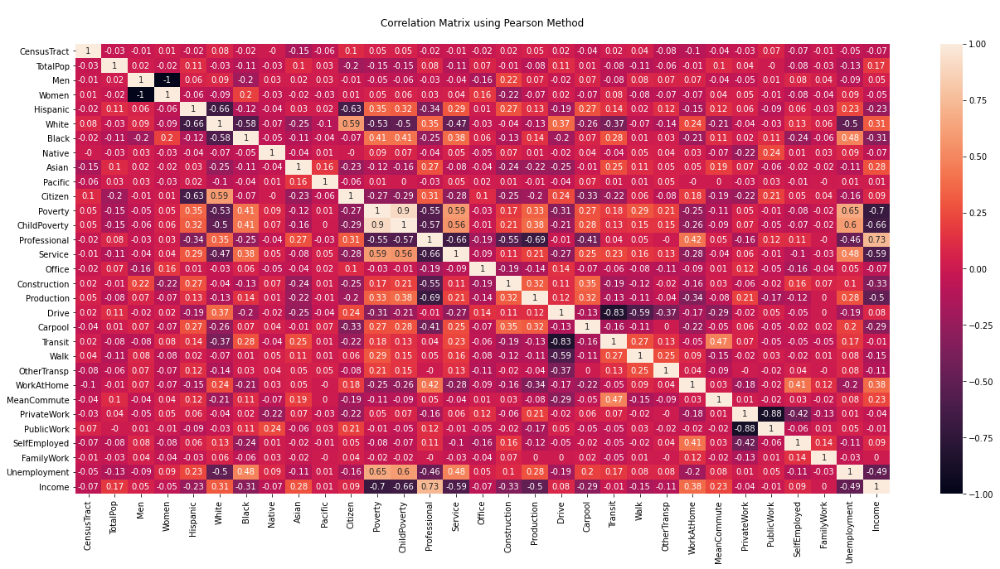

In [67]:
# plotting the correlation matrix
plt.figure(figsize=(22,10))
correlation_mat = df.corr().round(2)

sns.heatmap(correlation_mat, annot = True)
plt.title("\nCorrelation Matrix using Pearson Method\n")
#plt.savefig("corr.png",bbox_inches='tight')
plt.show()

# 3.Which state have highest Average income ?

In [68]:
avg_state_income = df.groupby(['State'])['Income'].mean()

fig = px.bar(avg_state_income, x=avg_state_income.index.values, y=avg_state_income.values, title="Average State Income")


fig.update_layout(
    title="Average State Income",
    xaxis_title="State",
    yaxis_title="Avg Income",
    legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)

fig.show()

### In this histogram, we found that top 5 states have highest income such as California(535.1586M), Florida(210.3136M),  Illinois(185.3157M), New York(308.017M),  and Texas(490.4916M).


## 4. Which state have highest GDP growth in US? 


In [69]:
avg_state_GDP = df.groupby(['State'])['Income'].sum()/df.groupby(['State'])['TotalPop'].mean()

fig = px.bar(avg_state_GDP, x=avg_state_GDP.index.values, y=avg_state_GDP.values, title="Average State Population")


fig.update_layout(
    title="Average State GDP",
    xaxis_title="State",
    yaxis_title="Avg GDP",
    legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)

fig.show()

#### From the above bar graph, this is clearly show the Average GDP Growth of states in US. Furthermore, we can say that California on the top among from other states, New York is occupied the second position in GDP category. At the end, there are also many states which contributing a lot in the GDP growth of US, but there are many states also which have less GDP growth

In [70]:
df_mean = df.groupby(['State']).mean()

In [71]:
fig = px.box(df, x="State", y="Income")

fig.update_layout(
    title="Box Plot for Income of different States",
#     xaxis_title="State",
#     yaxis_title="Avg Income",
#     legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)


fig.show()

In [72]:
fig = px.histogram(df, x="Income", color="State", nbins=100)
fig.show()

In [73]:
fig = px.histogram(df, x="State", y="Income", nbins=100)
fig.show()                                                         # Sum of Income of each State 

In [74]:
fig = px.pie(df, values='Income', names='State',
             title='Income of different states')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))
# fig.update_layout(uniformtext_minsize=20, uniformtext_mode='hide')
fig.show()

#### This pie chart also provides the same information like as above graph representation California  has highest income (12.8%), follow up the New York(7.38%) and  Texas(6.96%) and Florida(5.04%) and Illinois(4.44%) respectively.

In [75]:
fig = go.Figure(data=[
    go.Bar(name='Hispanic', x=df_mean.index, y=df_mean['Hispanic']),
    go.Bar(name='White', x=df_mean.index, y=df_mean['White']),
    go.Bar(name='Black', x=df_mean.index, y=df_mean['Black']),
    go.Bar(name='Native', x=df_mean.index, y=df_mean['Native']),
    go.Bar(name='Asian', x=df_mean.index, y=df_mean['Asian']),
    go.Bar(name='Pacific', x=df_mean.index, y=df_mean['Pacific'])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.update_layout(
    title="Bar Plot for of different races",
    width = 1000,
    height = 700,
#     xaxis_title="State",
#     yaxis_title="Avg Income",
#     legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        color="Green"
    )
)


fig.show()

#### As we already seen from the previous information that white people are more and as well, they are living above from the poverty level in the US states as compared to other population.

In [76]:
df.head()

,CensusTract,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
0,1001020100,Alabama,Autauga,1948,48.25,51.75,0.90,87.40,7.70,0.30,0.60,0.00,77.16,8.10,8.40,34.70,17.00,21.30,11.90,15.20,90.20,4.80,0.00,0.50,2.30,2.10,25.00,77.10,18.30,4.60,0.00,5.40,61838
1,1001020200,Alabama,Autauga,2156,49.12,50.88,0.80,40.40,53.30,0.00,2.30,0.00,77.09,25.50,40.30,22.30,24.70,21.50,9.40,22.00,86.30,13.10,0.00,0.00,0.70,0.00,23.40,77.00,16.90,6.10,0.00,13.30,32303
2,1001020300,Alabama,Autauga,2968,45.96,54.04,0.00,74.50,18.60,0.50,1.40,0.30,78.67,12.70,19.70,31.40,24.90,22.10,9.20,12.40,94.80,2.80,0.00,0.00,0.00,2.50,19.60,64.10,23.60,12.30,0.00,6.20,44922
3,1001020400,Alabama,Autauga,4423,49.11,50.89,10.50,82.80,3.70,1.60,0.00,0.00,74.75,2.10,1.60,27.00,20.80,27.00,8.70,16.40,86.60,9.10,0.00,0.00,2.60,1.60,25.30,75.70,21.20,3.10,0.00,10.80,54329
4,1001020500,Alabama,Autauga,10763,45.73,54.27,0.70,68.50,24.80,0.00,3.80,0.00,71.23,11.40,17.50,49.60,14.20,18.20,2.10,15.80,88.00,10.50,0.00,0.00,0.60,0.90,24.80,67.10,27.60,5.30,0.00,4.20,51965


In [77]:
df.drop(['TotalPop'], axis=1, inplace=True)

In [78]:
income1= df.corr()['Income'].abs().sort_values(ascending=False)
income1

Income         1.00
Professional   0.73
Poverty        0.70
ChildPoverty   0.66
Service        0.59
Production     0.50
Unemployment   0.49
WorkAtHome     0.38
Construction   0.33
White          0.31
Black          0.31
Carpool        0.29
Asian          0.28
MeanCommute    0.23
Hispanic       0.23
Walk           0.15
OtherTransp    0.11
SelfEmployed   0.09
Citizen        0.09
Drive          0.08
Native         0.07
CensusTract    0.07
Office         0.07
Women          0.05
Men            0.05
PrivateWork    0.04
Transit        0.01
Pacific        0.01
PublicWork     0.01
FamilyWork     0.00
Name: Income, dtype: float64

In [79]:
#columns_to_drop = corr[corr < 0.1].index.values #based on pearson correlation
#df.drop(columns_to_drop, axis=1, inplace=True)

In [80]:
cols = list(df.describe().columns)
# cols.pop(cols.index('CensusTract'))

## Model development

### Normalizing our attributes  using by min max scaler 

In [81]:
minimum = []
maximum = []

minimum.append(df['Income'].min())
maximum.append(df['Income'].max())

scaler = MinMaxScaler(feature_range=(0, 1))
df[cols] = scaler.fit_transform(df[cols])

df.head()

,CensusTract,State,County,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
0,0.00,Alabama,Autauga,0.46,0.54,0.01,0.87,0.08,0.00,0.01,0.00,0.75,0.08,0.08,0.35,0.23,0.29,0.17,0.25,0.90,0.09,0.00,0.01,0.04,0.02,0.31,0.73,0.21,0.09,0.00,0.08,0.24
1,0.00,Alabama,Autauga,0.47,0.53,0.01,0.40,0.53,0.00,0.03,0.00,0.75,0.26,0.40,0.22,0.33,0.29,0.14,0.37,0.86,0.23,0.00,0.00,0.01,0.00,0.28,0.73,0.20,0.13,0.00,0.19,0.12
2,0.00,Alabama,Autauga,0.43,0.57,0.00,0.74,0.19,0.01,0.02,0.00,0.77,0.13,0.20,0.31,0.34,0.30,0.13,0.21,0.95,0.05,0.00,0.00,0.00,0.03,0.22,0.58,0.28,0.25,0.00,0.09,0.17
3,0.00,Alabama,Autauga,0.47,0.53,0.10,0.83,0.04,0.02,0.00,0.00,0.73,0.02,0.02,0.27,0.28,0.36,0.13,0.27,0.87,0.16,0.00,0.00,0.04,0.02,0.31,0.72,0.25,0.06,0.00,0.16,0.21
4,0.00,Alabama,Autauga,0.43,0.57,0.01,0.69,0.25,0.00,0.04,0.00,0.69,0.12,0.18,0.50,0.19,0.24,0.03,0.26,0.88,0.19,0.00,0.00,0.01,0.01,0.30,0.62,0.32,0.11,0.00,0.06,0.20


In [82]:
df.describe()

,CensusTract,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Income
count,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00,72727.00
mean,0.38,0.47,0.53,0.17,0.62,0.13,0.01,0.05,0.00,0.69,0.17,0.22,0.35,0.26,0.32,0.13,0.21,0.76,0.17,0.06,0.03,0.03,0.05,0.32,0.76,0.17,0.13,0.01,0.13,0.22
std,0.23,0.04,0.04,0.23,0.31,0.22,0.04,0.10,0.01,0.12,0.13,0.19,0.15,0.11,0.08,0.09,0.13,0.15,0.09,0.13,0.06,0.04,0.04,0.11,0.09,0.09,0.08,0.02,0.08,0.12
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.17,0.44,0.51,0.02,0.39,0.01,0.00,0.00,0.00,0.64,0.07,0.07,0.24,0.18,0.27,0.07,0.12,0.72,0.11,0.00,0.00,0.01,0.02,0.24,0.70,0.11,0.07,0.00,0.07,0.14
50%,0.38,0.47,0.53,0.07,0.71,0.04,0.00,0.02,0.00,0.72,0.14,0.18,0.33,0.24,0.32,0.12,0.20,0.80,0.16,0.01,0.02,0.02,0.04,0.31,0.77,0.16,0.11,0.00,0.11,0.20
75%,0.58,0.49,0.56,0.21,0.88,0.14,0.00,0.05,0.00,0.76,0.23,0.34,0.44,0.32,0.37,0.18,0.29,0.85,0.22,0.05,0.04,0.04,0.07,0.38,0.82,0.21,0.17,0.00,0.16,0.27
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


## Split the data into train test split

In [83]:
X = df.iloc[:,3:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
print("The shape of X_train = ", X_train.shape)
print("The shape of y_train= ", y_train.shape)
print("The shape of X_test= ", X_test.shape)
print("The shape of y_test= ", y_test.shape)

The shape of X_train =  (58181, 28)
The shape of y_train=  (58181,)
The shape of X_test=  (14546, 28)
The shape of y_test=  (14546,)


## Decision Tree Regression 

In [84]:
from sklearn.tree import DecisionTreeRegressor
X = df.iloc[:,3:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

 #Build the decision tree model

DTree = DecisionTreeRegressor(random_state=0)
#Train the decision tree regression model to dataset
model = DTree.fit(X_train,y_train)

   #Predict on test features
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

  # evaluate model metrics

mse = mean_squared_error(y_test, y_pred)
r2_dtree = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

 
print("R2 score                = %.4f" % r2_dtree)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")


--------------------------------------------------

R2 score                = 0.6668
Explained Variance score= 0.6669
Mean absolute error     = 11182.9482
Mean squared error      = 270700418.0749
Root Mean squared error = 16452.9760

--------------------------------------------------



## Linear Regression 

In [85]:
X = df.iloc[:,3:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
#Build the linear regression model
lr = LinearRegression()
model = lr.fit(X_train,y_train)
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

mse = mean_squared_error(y_test, y_pred)
r2_LR = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print("R2 score                = %.4f" % r2_LR)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")


--------------------------------------------------

R2 score                = 0.7340
Explained Variance score= 0.7340
Mean absolute error     = 10378.0475
Mean squared error      = 216113696.5160
Root Mean squared error = 14700.8060

--------------------------------------------------



## SUPPORT VECTOR REGRESSION 

In [86]:
X = df.iloc[:,3:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
# Build the Support Vecrtor Regression
model = svm.SVR(kernel='rbf', gamma='scale',C=5).fit(X_train, y_train)
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

mse = mean_squared_error(y_test, y_pred)
r2_SVR = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print("R2 score                = %.4f" % r2_SVR)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")


--------------------------------------------------

R2 score                = 0.8236
Explained Variance score= 0.8397
Mean absolute error     = 9112.9407
Mean squared error      = 143357296.4446
Root Mean squared error = 11973.1907

--------------------------------------------------



## Random Forest Regression

In [87]:
X = df.iloc[:,3:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

RFModel = RandomForestRegressor(n_estimators = 50, random_state = 42, verbose = 1)
model = RFModel.fit(X_train,y_train)

y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")


mse = mean_squared_error(y_test, y_pred)
r2_random = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print("R2 score                = %.4f" % r2_random)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   53.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



--------------------------------------------------

R2 score                = 0.8454
Explained Variance score= 0.8455
Mean absolute error     = 7663.9464
Mean squared error      = 125596555.9169
Root Mean squared error = 11206.9869

--------------------------------------------------



[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.2s finished


In [44]:
X = df.iloc[:,3:-1].values
y = df['Income']

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

 #Build the random forest regressor model
RFModel = RandomForestRegressor(n_estimators = 100, random_state = 42, verbose = 1)

#Train the random forest regression model to dataset
model = RFModel.fit(X_train,y_train)

   #Predict on test features
y_pred = model.predict(X_test)

y_pred = y_pred*(maximum[0]-minimum[0]) + minimum[0]
y_test = y_test*(maximum[0]-minimum[0]) + minimum[0]

print("\n--------------------------------------------------\n")

  # evaluate model metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

 
print("R2 score                = %.4f" % r2)
print("Explained Variance score= %.4f" % evs)
print("Mean absolute error     = %.4f" % mae)
print("Mean squared error      = %.4f" % mse)
print("Root Mean squared error = %.4f" % rmse)
print("\n--------------------------------------------------\n")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  5.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



--------------------------------------------------

R2 score                = 0.8463
Explained Variance score= 0.8464
Mean absolute error     = 7636.8712
Mean squared error      = 124896040.7342
Root Mean squared error = 11175.6897

--------------------------------------------------



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.3s finished


In [624]:
# Comparing Accuracies

labels =["Decision Tree","Linear Regression","SVR", "Random Forest=50","Random Forest=500"]
x = [r2_dtree,r2_LR,r2_SVR,r2_random,r2]
eval_frame=pd.DataFrame()
eval_frame['Model']=labels
eval_frame['Train_test_split'] = x
eval_frame
#eval_frame.to_csv("eval_frame.csv",index=True)

,Model,Train_test_split
0,Decision Tree,0.67
1,Linear Regression,0.73
2,SVR,0.82
3,Random Forest,0.85


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



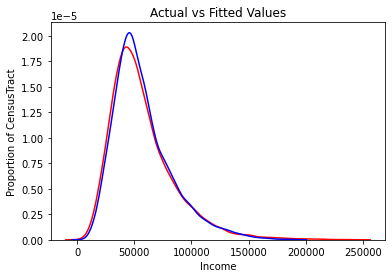

In [626]:
import matplotlib.pyplot as plt
plt.figure()
ax1 = sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred, hist=False, color="b", label="Fitted Values" , ax=ax1)

plt.title('Actual vs Fitted Values')
plt.xlabel('Income')
plt.ylabel('Proportion of CensusTract')

plt.show()
plt.close()